# YOUR PROJECT TITLE

> **Note the following:** 
> 1. This is *not* meant to be an example of an actual **data analysis project**, just an example of how to structure such a project.
> 1. Remember the general advice on structuring and commenting your code
> 1. The `dataproject.py` file includes a function which can be used multiple times in this notebook.

Imports and set magics:

In [173]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from matplotlib_venn import venn2 #%pip install matplotlib-venn
import pandas_datareader # install with `pip install pandas-datareader`
from dstapi import DstApi # install with `pip install git+https://github.com/alemartinello/dstapi`
from dmi_open_data import DMIOpenDataClient, Parameter, ClimateDataParameter # %pip install dmi-open-data
import datetime
from datetime import datetime
import requests
from requests.auth import HTTPBasicAuth
import tqdm
import pprint

# autoreload modules when code is run
%load_ext autoreload
%autoreload 2

# user written modules
import dataproject


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [65]:
data = DstApi('KN8MEST') 
tabsum = data.tablesummary(language='en')
display(tabsum)

Table KN8MEST: Imports and exports CN (EU Combined Nomenclature) by imports and exports, commodities, country, unit, Data source and time
Last update: 2023-03-13T08:00:00


,variable name,# values,First value,First value label,Last value,Last value label,Time variable
0,INDUD,2,1,Imports,2,Exports,False
1,VARE,10901,01012100,01012100 Pure-bred breeding horses,HHHHHHHH,HHHHHHHH HHHHHHHH Confidential,False
2,LAND,245,TOT,Total,QW,Countries not stated 3. countries,False
3,ENHED,3,98,Kg,97,Supplementary unit,False
4,DATAKILDE,3,TOT,Total trade,EST,Estimation for EU trade from companies exempte...,False
5,Tid,85,2016M01,2016M01,2023M01,2023M01,True


In [76]:
# The available values for a each variable: 
for variable in tabsum['variable name']:
    print(variable+':')
    display(data.variable_levels(variable, language='en'))

INDUD:


,id,text
0,1,Imports
1,2,Exports


VARE:


,id,text
0,01012100,01012100 Pure-bred breeding horses
1,01012910,01012910 Horses for slaughter
2,01012990,"01012990 Live horses (excl. for slaughter, pur..."
3,01013000,01013000 Live asses
4,01019000,01019000 Live mules and hinnies
...,...,...
10896,99909990,99909990 99909990
10897,99909995,99909995 99909995
10898,99909999,99909999 99909999
10899,TOT,TOT Total


LAND:


,id,text
0,TOT,Total
1,AF,Afghanistan
2,AL,Albania
3,DZ,Algeria
4,AS,American Samoa
...,...,...
240,AT,Austria
241,QX,Non disclosed
242,QU,Not stated
243,QV,Not stated country EU-countries


ENHED:


,id,text
0,98,Kg
1,99,DKK
2,97,Supplementary unit


DATAKILDE:


,id,text
0,TOT,Total trade
1,IND,Trade from reporting companies
2,EST,Estimation for EU trade from companies exempte...


Tid:


,id,text
0,2016M01,2016M01
1,2016M02,2016M02
2,2016M03,2016M03
3,2016M04,2016M04
4,2016M05,2016M05
...,...,...
80,2022M09,2022M09
81,2022M10,2022M10
82,2022M11,2022M11
83,2022M12,2022M12


In [77]:
params = data._define_base_params(language='en')
params

{'table': 'kn8mest',
 'format': 'BULK',
 'lang': 'en',
 'variables': [{'code': 'INDUD', 'values': ['*']},
  {'code': 'VARE', 'values': ['*']},
  {'code': 'LAND', 'values': ['*']},
  {'code': 'ENHED', 'values': ['*']},
  {'code': 'DATAKILDE', 'values': ['*']},
  {'code': 'Tid', 'values': ['*']}]}

In [92]:
# Or copy/paste/edit
params = {'table': 'KN8MEST',
 'format': 'BULK',
 'lang': 'en',
 'variables': [{'code': 'INDUD', 'values': ['1']},
  {'code': 'VARE', 'values': ['22030001', '22030009', '22030010']},
  {'code': 'LAND', 'values': ['TOT']},
  {'code': 'ENHED', 'values': ['99']},
  {'code': 'DATAKILDE', 'values': ['TOT']},
  {'code': 'Tid', 'values': ['>=2016M01<=2023M01']}]}

In [166]:
inc_api = data.get_data(params=params)
inc_api.head(5)

,INDUD,VARE,LAND,ENHED,DATAKILDE,TID,INDHOLD
0,Imports,"22030001 Beer made from malt, in bottles holdi...",Total,DKK,Total trade,2016M01,9722940
1,Imports,"22030009 Beer made from malt, in containers ho...",Total,DKK,Total trade,2016M01,6681647
2,Imports,"22030010 Malt beer, in containers holding > 10 l",Total,DKK,Total trade,2016M01,4096601
3,Imports,"22030001 Beer made from malt, in bottles holdi...",Total,DKK,Total trade,2016M02,12015582
4,Imports,"22030009 Beer made from malt, in containers ho...",Total,DKK,Total trade,2016M02,8497217


In [165]:
df = pd.DataFrame(inc_api)
df['Vare Number'] = df['VARE'].str.extract('(\d+)')

In [164]:
df2 = df[['INDHOLD', 'TID']].loc[df['Vare Number']=='22030001'].reset_index()
df2 = df2.rename(columns={"INDHOLD": "22030001", "TID": "TID"})
df2 = df2.drop(['index'], axis=1)
df2 = df2.set_index('TID')

df3 = df[['INDHOLD', 'TID']].loc[df['Vare Number']=='22030009'].reset_index()
df3 = df3.rename(columns={"INDHOLD": "22030009", "TID": "TID"})
df3 = df3.drop(['index'], axis=1)
df3 = df3.set_index('TID')

df4 = df[['INDHOLD', 'TID']].loc[df['Vare Number']=='22030010'].reset_index()
df4 = df4.rename(columns={"INDHOLD": "22030010", "TID": "TID"})
df4 = df4.drop(['index'], axis=1)
df4 = df4.set_index('TID')

df5 = df2.join(df3).join(df4)
df5['Total'] = df5['22030001'] + df5['22030009'] + df5['22030010']

In [234]:
print (df5)

         22030001  22030009  22030010     Total
TID                                            
2016M01   9722940   6681647   4096601  20501188
2016M02  12015582   8497217   6469322  26982121
2016M03  15077516  10599282   6110712  31787510
2016M04  17708210  13783587   4774346  36266143
2016M05  18804060  12045262   5857073  36706395
...           ...       ...       ...       ...
2022M09  14085246  14808083   8109502  37002831
2022M10  11995209  12301954   7163596  31460759
2022M11  10083465  12191533   7290667  29565665
2022M12   7120084   9893456   5173848  22187388
2023M01   1451543   1661181    838931   3951655

[85 rows x 4 columns]


22030001 = x, 
22030009 = y, 
22030010 = z

<AxesSubplot:xlabel='Tid', ylabel='DKK'>

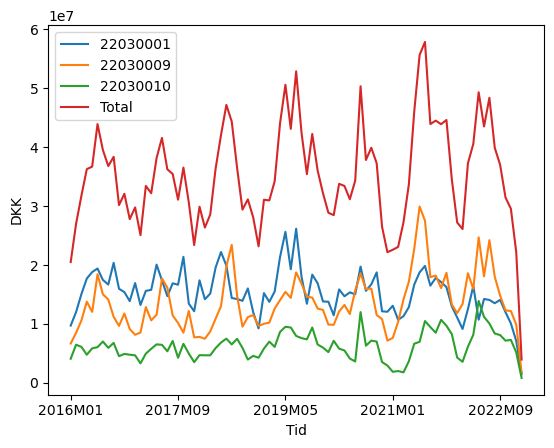

In [170]:
df5.plot(ylabel='DKK', xlabel='Tid')

In [235]:
#50a21dd8-a4e1-4571-a21d-d8a4e1c57140

var_="temp_mean_past1h"
station_id="30414"

url="dmigw.govcloud.dk/v2/metObs/station/collections/observations/items?station_id=30414&period=latest&limit=100000&api_key=7f3691f7-d775-4f17-aaba-2632b53d8b74"
url2="https://dmigw.govcloud.dk/v2/metObs/collections/observation/items?parameterId=temp_mean_past1h&stationId=06181&limit=35000&api-key=7f3691f7-d775-4f17-aaba-2632b53d8b74"
auth=HTTPBasicAuth('apikey', '7f3691f7-d775-4f17-aaba-2632b53d8b74')
response=requests.get(url2)
data=response.json()


In [236]:
pprint.pprint(response.json()) #Everything is aranged alphabetically and in appropriate levels

{'features': [{'geometry': {'coordinates': [12.5263, 55.7664], 'type': 'Point'},
               'id': 'c4a90557-7a61-65ba-8e64-3bd3e1e6345a',
               'properties': {'created': '2023-04-04T20:00:43.792366Z',
                              'observed': '2023-04-04T20:00:00Z',
                              'parameterId': 'temp_mean_past1h',
                              'stationId': '06181',
                              'value': 4.4},
               'type': 'Feature'},
              {'geometry': {'coordinates': [12.5263, 55.7664], 'type': 'Point'},
               'id': 'd39aa904-5deb-6179-38e7-d32fd0c732c7',
               'properties': {'created': '2023-04-04T19:00:56.792379Z',
                              'observed': '2023-04-04T19:00:00Z',
                              'parameterId': 'temp_mean_past1h',
                              'stationId': '06181',
                              'value': 5.3},
               'type': 'Feature'},
              {'geometry': {'coordinates': [12

In [237]:
response=requests.get(url2).json()
temp=response['features'][0]
print(temp)

{'geometry': {'coordinates': [12.5263, 55.7664], 'type': 'Point'}, 'id': 'c4a90557-7a61-65ba-8e64-3bd3e1e6345a', 'type': 'Feature', 'properties': {'created': '2023-04-04T20:00:43.792366Z', 'observed': '2023-04-04T20:00:00Z', 'parameterId': 'temp_mean_past1h', 'stationId': '06181', 'value': 4.4}}


In [238]:
def getdata(url):
    response=requests.get(url).json()
    temp_list=[]
    date_list=[]
    for i in tqdm.tqdm(range(len(response['features']))):
        temp=response['features'][i]['properties']['value']
        temp_list.append(temp)
    for i in tqdm.tqdm(range(len(response['features']))):
        date=response['features'][i]['properties']['observed']
        date_list.append(date)
    #temp=pd.DataFrame.from_dict(data)
    return temp_list , date_list
dmi_data=getdata(url2)
temp_df=pd.DataFrame(dmi_data)
temp_df=temp_df.transpose()
temp_df=temp_df.rename(columns={0:"temp_jægersborg", 1:"dato"})

100%|██████████| 35000/35000 [00:00<00:00, 2582790.39it/s]


In [239]:
#temp_df["dato"] = pd.to_datetime(temp_df["dato"])
temp_df['dato'] = temp_df['dato'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ').strftime('%YM%m'))
temp_df.set_index('dato', inplace=True)
#temp_df = temp_df.groupby(pd.Grouper(freq='M')).sum()
temp_df = temp_df.groupby('dato')['temp_jægersborg'].sum()

# Read and clean data

Import your data, either through an API or manually, and load it. 

## Explore each data set

In order to be able to **explore the raw data**, you may provide **static** and **interactive plots** to show important developments 

**Interactive plot** :

In [2]:
def plot_func():
    # Function that operates on data set
    pass

widgets.interact(plot_func, 
    # Let the widget interact with data through plot_func()    
); 


interactive(children=(Output(),), _dom_classes=('widget-interact',))

Explain what you see when moving elements of the interactive plot around. 

# Merge data sets

Now you create combinations of your loaded data sets. Remember the illustration of a (inner) **merge**:

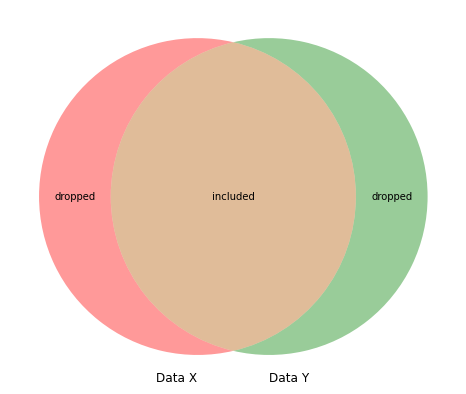

In [3]:
plt.figure(figsize=(15,7))
v = venn2(subsets = (4, 4, 10), set_labels = ('Data X', 'Data Y'))
v.get_label_by_id('100').set_text('dropped')
v.get_label_by_id('010').set_text('dropped' )
v.get_label_by_id('110').set_text('included')
plt.show()

Here we are dropping elements from both data set X and data set Y. A left join would keep all observations in data X intact and subset only from Y. 

Make sure that your resulting data sets have the correct number of rows and columns. That is, be clear about which observations are thrown away. 

**Note:** Don't make Venn diagrams in your own data project. It is just for exposition. 

# Analysis

To get a quick overview of the data, we show some **summary statistics** on a meaningful aggregation. 

MAKE FURTHER ANALYSIS. EXPLAIN THE CODE BRIEFLY AND SUMMARIZE THE RESULTS.

# Conclusion

ADD CONCISE CONLUSION.